In [ ]:
import sys
sys.path.insert(0, "../../..")
from paths import DATA_DIR, FIG_DIR

import numpy as np
import scanpy as sc
import scvelo as scv
import dynamo as dyn

import matplotlib.pyplot as plt
%matplotlib inline

from graphvelo.graph_velocity import GraphVelo

In [2]:
save = True
save_for_pre = False

In [3]:
dyn.configuration.reset_rcParams()
if save_for_pre:
    dyn.configuration.set_figure_params('dynamo', background='black')

In [4]:
adata = dyn.read(DATA_DIR / 'ST/spateo_data/mousebrain_bin60_annot.h5ad')
adata

AnnData object with n_obs × n_vars = 7765 × 25691
    obs: 'area', 'n_counts', 'celltype'
    uns: '__type', 'pp', 'spatial'
    obsm: 'X_spatial', 'bbox', 'contour', 'spatial'
    layers: 'count', 'spliced', 'unspliced'

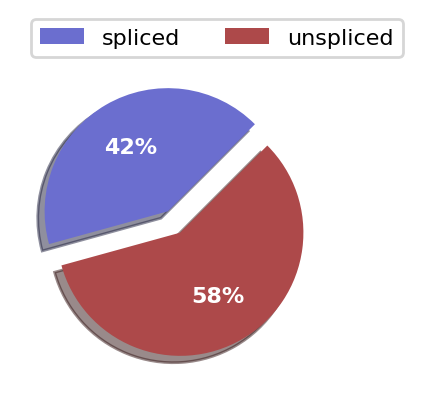

In [6]:
ax = scv.pl.proportions(adata, show=False)
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/mouse_brain_proportions.pdf', bbox_inches = "tight")
plt.show()

|-----------> plotting with basis key=X_spatial
|-----------> skip filtering celltype by stack threshold when stacking color because it is not a numeric type


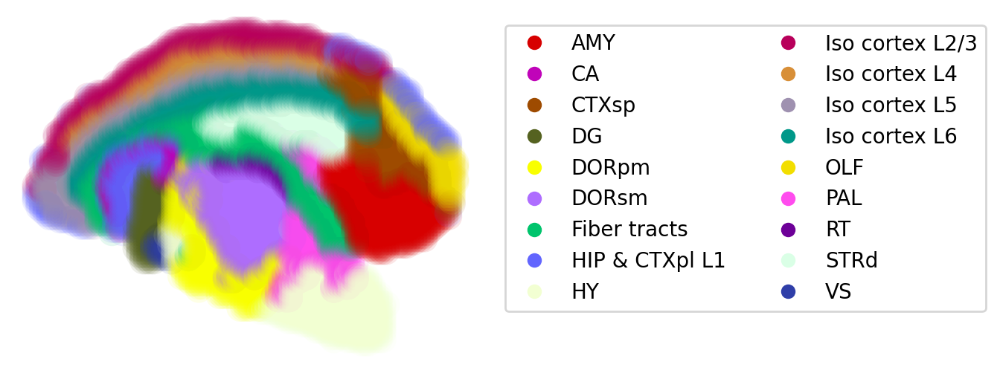

In [7]:
ax = dyn.pl.scatters(adata, basis='spatial', color=['celltype'], show_legend="right", figsize=(4,3), save_show_or_return='return')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/mousebrain.pdf', bbox_inches = "tight")
plt.show()

In [5]:
dyn.pp.recipe_monocle(adata)
dyn.tl.neighbors(adata)
dyn.tl.reduceDimension(adata)

|-----? dynamo.preprocessing.deprecated is deprecated.
|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----> filtering cells...


/var/folders/zr/17m1_r_x57q5mxr1zs8px9rh0000gn/T/ipykernel_20034/3262411670.py:1: DeprecationWarning: recipe_monocle is deprecated and will be removed in a future release. Please update your code to use the new replacement function.
  dyn.pp.recipe_monocle(adata)


|-----> 7752 cells passed basic filters.
|-----> filtering gene...
|-----> 5114 genes passed basic filters.
|-----> calculating size factor...
|-----> selecting genes in layer: X, sort method: SVR...
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> Set <adata.X> to normalized data
|-----> applying PCA ...
|-----> <insert> X_pca to obsm in AnnData Object.
|-----> cell cycle scoring...
|-----> computing cell phase...
|-----? 
Dynamo is not able to perform cell cycle staging for you automatically. 
Since dyn.pl.phase_diagram in dynamo by default colors cells by its cell-cycle stage, 
you need to set color argument accordingly if confronting errors related to this.
|-----> [recipe_monocle preprocess] completed [3.4936s]
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method pynn s

In [9]:
dyn.tl.neighbors(adata, n_neighbors=8, basis="spatial", result_prefix="spatial")
adata.obsp['expr_connectivities'] = adata.obsp["connectivities"].copy()
conn = adata.obsp["connectivities"].copy()
conn.data[conn.data > 0] = 1
adj = conn + adata.obsp["spatial_connectivities"]
adj.data[adj.data > 0] = 1
adata.obsp['connectivities'] = adj
nbrs, _ = dyn.tl.connectivity.adj_to_knn(adj, 38)
adata.uns['neighbors'] = {'indices':nbrs}

|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:spatial
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected


In [10]:
dyn.tl.dynamics(adata, assumption_mRNA='kinetic')
dyn.tl.cell_velocities(adata, enforce=True)

|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] completed [15.4704s]


estimating gamma: 100%|██████████| 2000/2000 [00:47<00:00, 42.31it/s]
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/tools/utils.py:2605: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if np.all(vel_params_df.gamma_r2.values is None) or np.all(vel_params_df.gamma_r2.values == ""):


|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%|-----> [calculating transition matrix via pearson kernel with sqrt transform.] completed [4.7653s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding] completed [0.6442s]
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected


AnnData object with n_obs × n_vars = 7765 × 25691
    obs: 'area', 'n_counts', 'celltype', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: '__type', 'pp', 'spatial', 'celltype_colors', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'neighbors', 'umap_fit', 'spatial_neighbors', 'vel_params_names', 'dynamics', 'grid_velocity_umap'
    obsm: 'X_spatial', 'bbox', 'contour', 'spatial', 'X_pca', 'X', 'X_umap', 'velocity_umap'
    varm: 'vel_params'
    layers: 'count', 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'distances', 'connectivities', 'spatial_distances', 'spati

Learning Phi in tangent space projection.: 100%|██████████| 7765/7765 [00:05<00:00, 1373.86it/s]
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/graphvelo/graph_velocity.py:373: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(T[T>0])


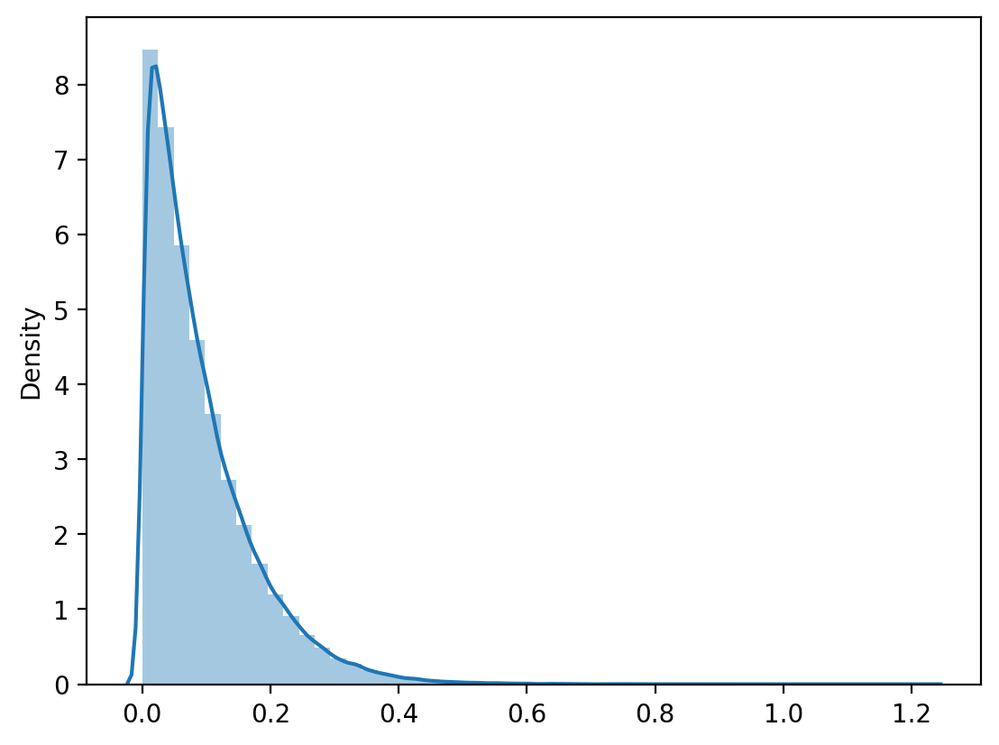

In [13]:
gv = GraphVelo(adata, gene_subset=adata[:, adata.var['use_for_transition']].var_names, xkey='M_s', vkey='velocity_S')
gv.train()
gv.write_to_adata(adata)
gv.plot_phi_dist()

In [14]:
adata.layers['velocity_gv'] = gv.project_velocity(adata.layers['M_s'])
adata.obsm['gv_spatial'] = gv.project_velocity(adata.obsm['X_spatial'])
adata.obsm['gv_pca'] = gv.project_velocity(adata.obsm['X_pca'])
adata.obsm['gv_umap'] = gv.project_velocity(adata.obsm['X_umap'])

projecting velocity vector to low dimensional embedding: 100%|██████████| 7765/7765 [00:29<00:00, 265.05it/s]
projecting velocity vector to low dimensional embedding: 100%|██████████| 7765/7765 [00:00<00:00, 21510.12it/s]
projecting velocity vector to low dimensional embedding: 100%|██████████| 7765/7765 [00:00<00:00, 20527.50it/s]
projecting velocity vector to low dimensional embedding: 100%|██████████| 7765/7765 [00:00<00:00, 17524.41it/s]


|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_umap
|-----------> skip filtering celltype by stack threshold when stacking color because it is not a numeric type


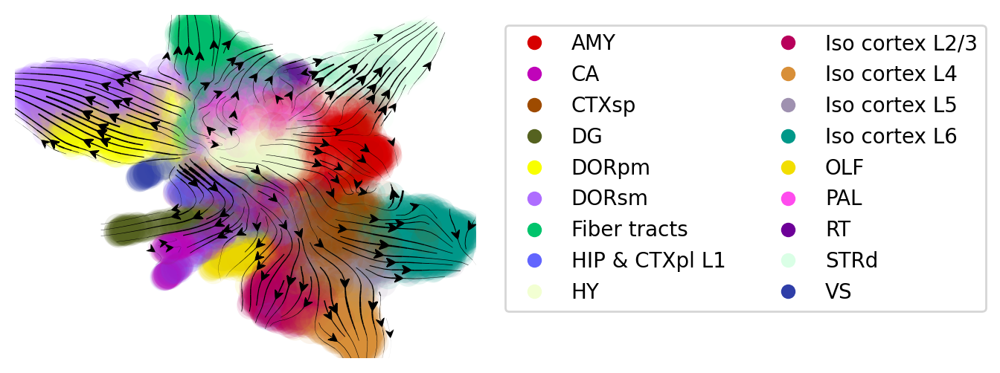

In [30]:
ax=dyn.pl.streamline_plot(adata, color='celltype', vector='gv', show_legend="right", figsize=(4,3), save_show_or_return='return')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/vector_field.pdf', bbox_inches = "tight")
plt.show()

In [16]:
sp_conn = adata.obsp['spatial_connectivities']
adata.obs['speed'] = np.linalg.norm(adata.layers['velocity_gv'].toarray(), axis=1) @ sp_conn.multiply(1.0 / sp_conn.sum(1))
adata.obs['speed_dyn'] = np.linalg.norm(adata.layers['velocity_S'].toarray(), axis=1) @ sp_conn.multiply(1.0 / sp_conn.sum(1))

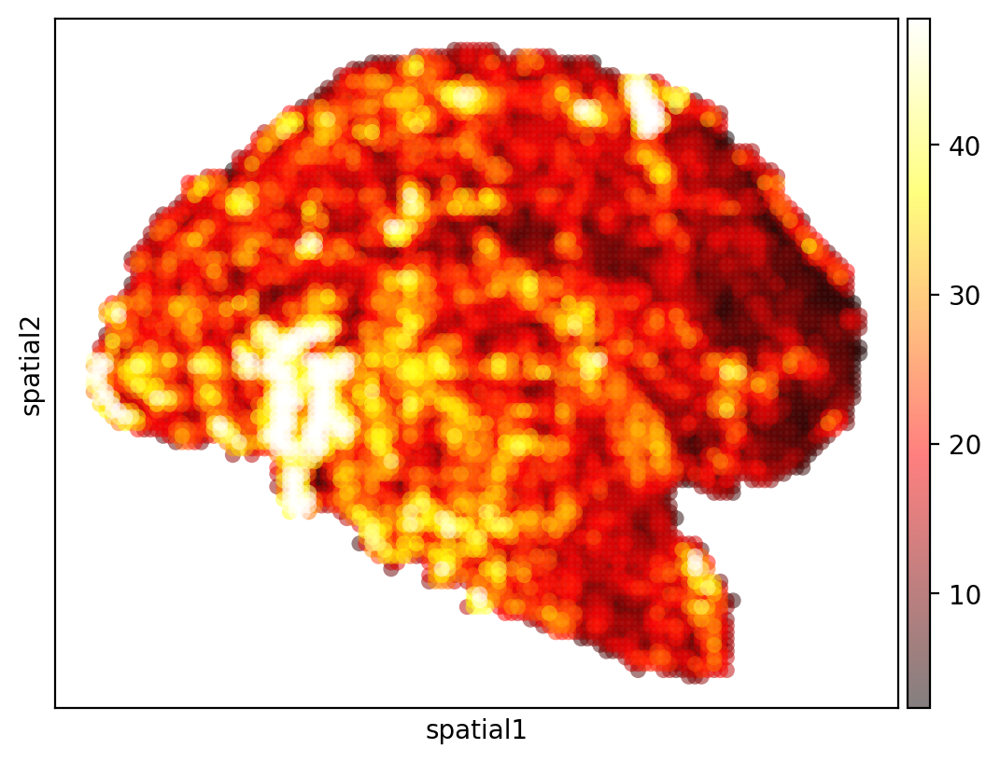

In [58]:
ax = sc.pl.embedding(adata, basis='spatial', color=['speed'], color_map='hot', size=150, alpha=0.5,show=False, vmax='p98')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/gv_speed.pdf', bbox_inches = "tight")
plt.show()

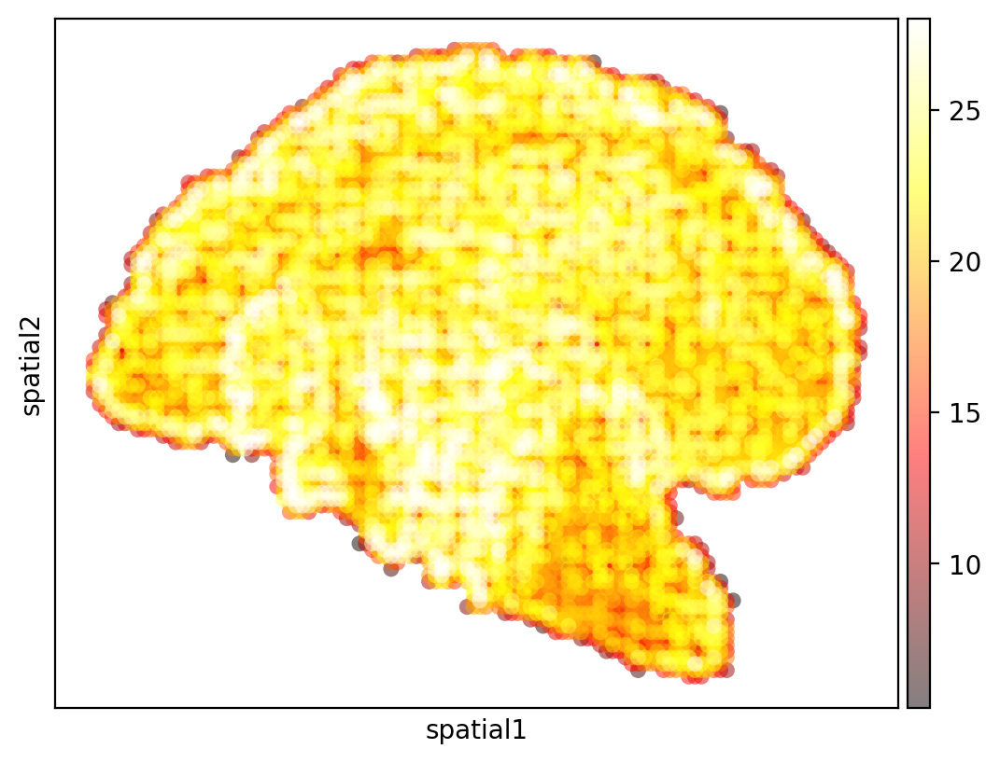

In [49]:
ax = sc.pl.embedding(adata, basis='spatial', color=['speed_dyn'], color_map='hot', size=150, alpha=0.5,show=False, vmax='p98')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/dyn_speed.pdf', bbox_inches = "tight")
plt.show()

/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


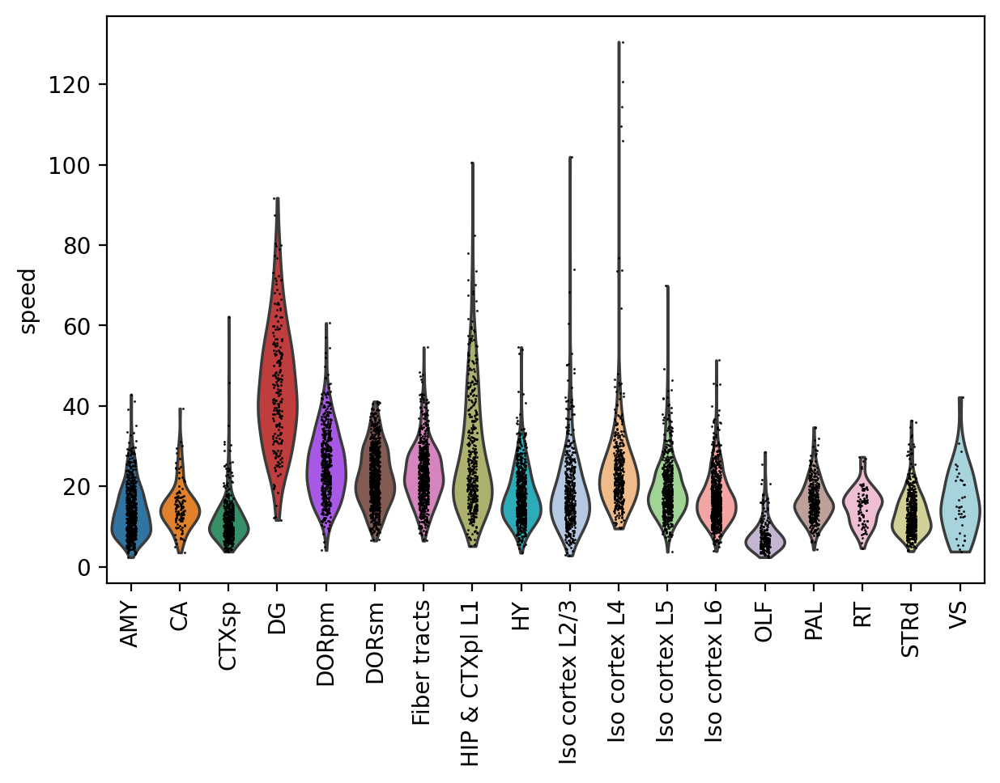

In [62]:
ax = sc.pl.violin(adata, keys='speed', groupby='celltype', rotation=90, show=False)
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/speed_violinplot.pdf', bbox_inches = "tight")
plt.show()

|-----------> plotting with basis key=X_umap


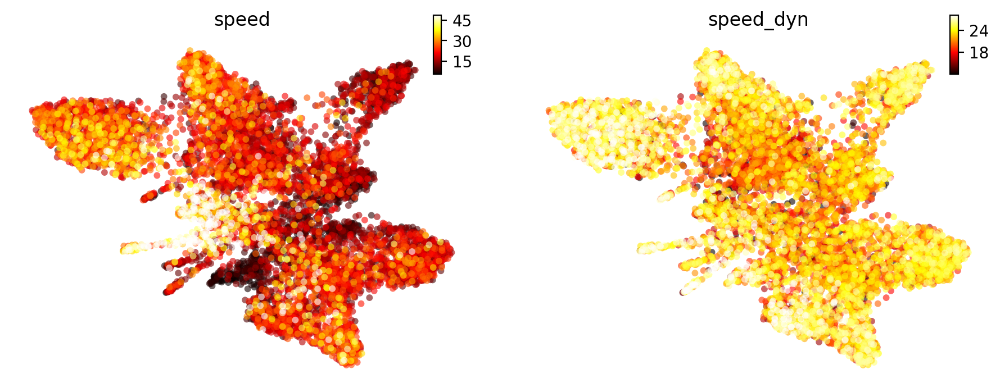

In [27]:
dyn.pl.scatters(adata, color=['speed', 'speed_dyn'], cmap='hot', pointsize=0.1, alpha=0.6)

|-----------> plotting with basis key=X_spatial


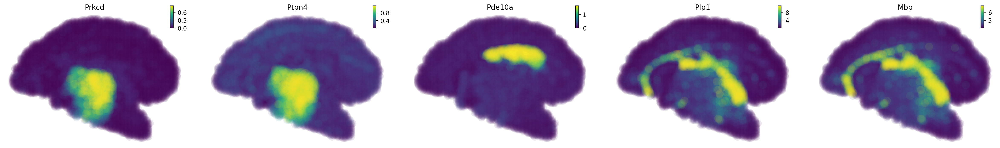

|-----------> plotting with basis key=X_spatial


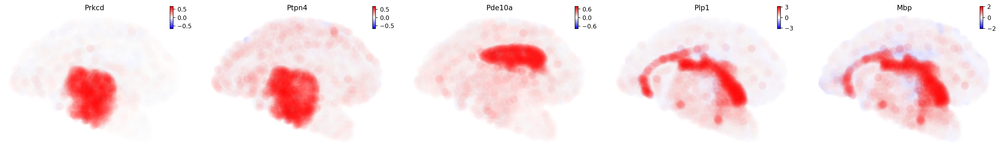

|-----------> plotting with basis key=X_spatial


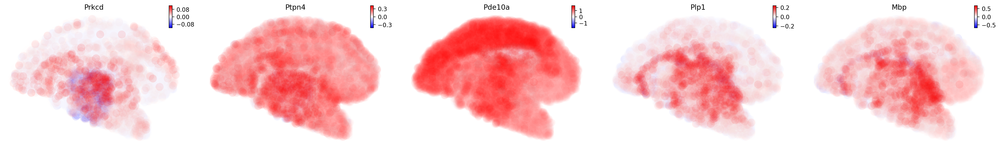

In [ ]:
selected_genes = ['Prkcd', 'Ptpn4', 'Pde10a', 'Plp1', 'Mbp']
ax=dyn.pl.scatters(adata, basis='spatial', color=selected_genes, cmap='viridis', layer='M_s', ncols=5, save_show_or_return='return')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/M_s.png', bbox_inches = "tight")
plt.show()

ax=dyn.pl.scatters(adata, basis='spatial', color=selected_genes, cmap='bwr', layer='velocity_gv', sym_c=True, ncols=5, save_show_or_return='return')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/gv.png', bbox_inches = "tight")
plt.show()

ax=dyn.pl.scatters(adata, basis='spatial', color=selected_genes, cmap='bwr', layer='velocity_S', sym_c=True, ncols=5, save_show_or_return='return')
plt.title('')
plt.savefig(dpi=300, transparent=True, fname=f'../../../figures/suppl_figures_ST/dyn.png', bbox_inches = "tight")
plt.show()